# Profiling main skforecast classes and methods

In [1]:
%load_ext autoreload
%autoreload 2
import sys
from pathlib import Path
sys.path.insert(1, str(Path.cwd().parent))
str(Path.cwd().parent)

'c:\\Users\\jaesc2\\GitHub\\skforecast'

In [2]:
import platform
import psutil
import skforecast
import pandas as pd
import numpy as np
import scipy
import sklearn
import numpy as np
import pandas as pd
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMRegressor
from skforecast.recursive import ForecasterRecursiveMultiSeries
from skforecast.model_selection import grid_search_forecaster_multiseries
from skforecast.utils.utils import align_series_and_exog_multiseries
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import make_column_transformer
from skforecast.preprocessing import series_long_to_dict
from skforecast.preprocessing import exog_long_to_dict
from skforecast.datasets import fetch_dataset

%load_ext pyinstrument
%load_ext line_profiler

# Information system and libraries

In [3]:
# Versions
# ==============================================================================
print(f"Python version: {platform.python_version()}")
print(f"scikit-learn version: {sklearn.__version__}")
print(f"skforecast version: {skforecast.__version__}")
print(f"pandas version: {pd.__version__}")
print(f"numpy version: {np.__version__}")
print(f"scipy version: {scipy.__version__}")
print(f"psutil version: {psutil.__version__}")
print("")

# Computer information
# ==============================================================================
print(f"Machine type: {platform.machine()}")
print(f"Processor type: {platform.processor()}")
print(f"Platform type: {platform.platform()}")
print(f"Operating system: {platform.system()}")
print(f"Operating system release: {platform.release()}")
print(f"Operating system version: {platform.version()}")
print(f"Number of physical cores: {psutil.cpu_count(logical=False)}")
print(f"Number of logical cores: {psutil.cpu_count(logical=True)}")

Python version: 3.11.10
scikit-learn version: 1.5.2
skforecast version: 0.15.0
pandas version: 2.2.3
numpy version: 1.26.4
scipy version: 1.14.1
psutil version: 6.0.0

Machine type: AMD64
Processor type: Intel64 Family 6 Model 141 Stepping 1, GenuineIntel
Platform type: Windows-10-10.0.19045-SP0
Operating system: Windows
Operating system release: 10
Operating system version: 10.0.19045
Number of physical cores: 8
Number of logical cores: 16


In [4]:
# Data
# ==============================================================================
data = fetch_dataset(name='bdg2_daily')

infrequent_types = (
    data
    .drop_duplicates(subset=['building_id'])['primaryspaceusage']
    .value_counts()
    .loc[lambda x: x < 100]
    .index
    .tolist()
)
infrequent_subtypes = (
    data
    .drop_duplicates(subset=['building_id'])['sub_primaryspaceusage']
    .value_counts()
    .loc[lambda x: x < 50]
    .index
    .tolist()
)

data['primaryspaceusage'] = np.where(
    data['primaryspaceusage'].isin(infrequent_types),
    'Other',
    data['primaryspaceusage']
)
data['sub_primaryspaceusage'] = np.where(
    data['sub_primaryspaceusage'].isin(infrequent_subtypes),
    'Other',
    data['sub_primaryspaceusage']
)

# Calendar features
# ==============================================================================
data['day_of_week'] = data.index.dayofweek
data['week_of_year'] = data.index.isocalendar().week.astype(int)
data['month'] = data.index.month

# Cyclical encoding of calendar features
# ==============================================================================
data['sin_day_of_week'] = np.sin(2*np.pi*data['day_of_week']/7)
data['cos_day_of_week'] = np.cos(2*np.pi*data['day_of_week']/7)
data['sin_week_of_year'] = np.sin(2*np.pi*data['week_of_year']/52)
data['cos_week_of_year'] = np.cos(2*np.pi*data['week_of_year']/52)
data['sin_month'] = np.sin(2*np.pi*data['month']/12)
data['cos_month'] = np.cos(2*np.pi*data['month']/12)

# Transformer: ordinal encoding
# ==============================================================================
# A ColumnTransformer is used to transform categorical (not numerical) features
# using ordinal encoding. Numeric features are left untouched. Missing values
# are coded as -1. If a new category is found in the test set, it is encoded
# as -1.
categorical_features = ['primaryspaceusage', 'sub_primaryspaceusage', 'timezone']
transformer_exog = make_column_transformer(
                       (
                           OrdinalEncoder(
                               dtype=float,
                               handle_unknown="use_encoded_value",
                               unknown_value=np.nan,
                               encoded_missing_value=np.nan
                           ),
                           categorical_features
                       ),
                       remainder="passthrough",
                       verbose_feature_names_out=False,
                   ).set_output(transform="pandas")
transformer_exog

# Exogenous features selected for modeling
# ==============================================================================
exog_features = [
    "primaryspaceusage",
    "sub_primaryspaceusage",
    "timezone",
    "sqm",
    "airTemperature",
    "cloudCoverage",
    "dewTemperature",
    "precipDepth1HR",
    "precipDepth6HR",
    "seaLvlPressure",
    "windDirection",
    "windSpeed",
    "sin_day_of_week",
    "cos_day_of_week",
    "sin_week_of_year",
    "cos_week_of_year",
    "sin_month",
    "cos_month",
]

# Transform series and exog to dictionaries
# ==============================================================================
series_dict = series_long_to_dict(
    data      = data.reset_index(),
    series_id = 'building_id',
    index     = 'timestamp',
    values    = 'meter_reading',
    freq      = 'D'
)

exog_dict = exog_long_to_dict(
    data      = data[exog_features + ['building_id']].reset_index(),
    series_id = 'building_id',
    index     = 'timestamp',
    freq      = 'D'
)

data = data.sort_index()
end_train = '2017-08-31 23:59:00'
end_validation = '2017-10-31 23:59:00'
series_dict_train = {k: v.loc[: end_train,] for k, v in series_dict.items()}
series_dict_valid = {k: v.loc[end_train: end_validation,] for k, v in series_dict.items()}
series_dict_test = {k: v.loc[end_validation:,] for k, v in series_dict.items()}
exog_dict_train = {k: v.loc[: end_train,] for k, v in exog_dict.items()}
exog_dict_valid = {k: v.loc[end_train: end_validation,] for k, v in exog_dict.items()}
exog_dict_test = {k: v.loc[end_validation:,] for k, v in exog_dict.items()}

bdg2_daily
----------
Daily energy consumption data from the The Building Data Genome Project 2 with
building metadata and weather data. https://github.com/buds-lab/building-data-
genome-project-2
Miller, C., Kathirgamanathan, A., Picchetti, B. et al. The Building Data Genome
Project 2, energy meter data from the ASHRAE Great Energy Predictor III
competition. Sci Data 7, 368 (2020). https://doi.org/10.1038/s41597-020-00712-x
Shape of the dataset: (1153518, 17)


In [5]:
# Forecaster
# ==============================================================================
forecaster = ForecasterRecursiveMultiSeries(
    regressor=LGBMRegressor(random_state=8520, verbose=-1),
    lags=14,
    transformer_series=None,
    transformer_exog=transformer_exog,
    fit_kwargs={'categorical_feature': categorical_features},
    encoding="ordinal"
)

/home/ubuntu/varios/skforecast/skforecast/recursive/_forecaster_recursive_multiseries.py:1079: MissingValuesWarning: NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(


_     ._   __/__   _ _  _  _ _/_   Recorded: 15:46:38  Samples:  10789
 /_//_/// /_\ / //_// / //_'/ //     Duration: 17.329    CPU time: 56.763
/   _/                      v5.0.0

Cell [6]

17.328 <module>  /tmp/ipykernel_94632/2636560737.py:1
`- 17.326 ForecasterRecursiveMultiSeries.fit  skforecast/recursive/_forecaster_recursive_multiseries.py:1473
   |- 10.834 ForecasterRecursiveMultiSeries._create_train_X_y  skforecast/recursive/_forecaster_recursive_multiseries.py:836
   |  |- 3.668 align_series_and_exog_multiseries  skforecast/utils/utils.py:2406
   |  |  |- 2.292 _LocIndexer.__getitem__  pandas/core/indexing.py:1176
   |  |  |     [17 frames hidden]  pandas
   |  |  |- 0.461 Series.first_valid_index  pandas/core/generic.py:12792
   |  |  |     [6 frames hidden]  pandas
   |  |  |- 0.446 DatetimeIndex.intersection  pandas/core/indexes/base.py:3449
   |  |  |     [2 frames hidden]  pandas, numpy
   |  |  `- 0.400 Series.last_valid_index  pandas/core/generic.py:12868
   |  |        [6 frames hidden]  pandas
   |  |- 2.237 ForecasterRecursiveMultiSeries._create_train_X_y_single_series  skforecast/recursive/_forecaster_recursive_multiseries.py:716
   |  |  |- 0.868 DataFrame.__setitem__  pandas/core/frame.py:4271
   |  |  |     [6 frames hidden]  pandas
   |  |  |- 0.643 ForecasterRecursiveMultiSeries._create_lags  skforecast/recursive/_forecaster_recursive_multiseries.py:604
   |  |  |  `- 0.418 DataFrame.__init__  pandas/core/frame.py:694
   |  |  |        [4 frames hidden]  pandas
   |  |  |- 0.308 _iLocIndexer.__getitem__  pandas/core/indexing.py:1176
   |  |  |     [5 frames hidden]  pandas
   |  |  `- 0.259 Series.__init__  pandas/core/series.py:389
   |  |- 1.178 concat  pandas/core/reshape/concat.py:157
   |  |     [3 frames hidden]  pandas
   |  |- 1.126 check_preprocess_exog_multiseries  skforecast/utils/utils.py:2237
   |  |  |- 0.450 <genexpr>  skforecast/utils/utils.py:2328
   |  |  |  `- 0.450 DataFrame.copy  pandas/core/generic.py:6662
   |  |  |        [4 frames hidden]  pandas, <built-in>
   |  |  |- 0.331 concat  pandas/core/reshape/concat.py:157
   |  |  |     [6 frames hidden]  pandas
   |  |  `- 0.294 DataFrame.dtypes  pandas/core/generic.py:6432
   |  |     `- 0.233 Series.__init__  pandas/core/series.py:389
   |  |- 0.804 transform_dataframe  skforecast/utils/utils.py:1766
   |  |  `- 0.802 ColumnTransformer.wrapped  sklearn/utils/_set_output.py:311
   |  |        [17 frames hidden]  sklearn, joblib, <built-in>
   |  |- 0.718 check_preprocess_series  skforecast/utils/utils.py:2135
   |  |  |- 0.331 Series.copy  pandas/core/generic.py:6662
   |  |  |     [3 frames hidden]  pandas
   |  |  `- 0.294 Series.__array_ufunc__  pandas/core/generic.py:2167
   |  |        [4 frames hidden]  pandas
   |  |- 0.597 _iLocIndexer.__getitem__  pandas/core/indexing.py:1176
   |  |     [6 frames hidden]  pandas
   |  `- 0.244 OrdinalEncoder.wrapped  sklearn/utils/_set_output.py:311
   |        [4 frames hidden]  sklearn
   |- 3.364 LGBMRegressor.fit  lightgbm/sklearn.py:1156
   |     [7 frames hidden]  lightgbm
   |- 1.747 [self]  skforecast/recursive/_forecaster_recursive_multiseries.py
   |- 0.803 DatetimeIndex.__getitem__  pandas/core/indexes/base.py:5373
   |     [7 frames hidden]  pandas
   `- 0.543 LGBMRegressor.predict  lightgbm/sklearn.py:991
         [4 frames hidden]  lightgbm
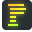

In [6]:
%%pyinstrument

forecaster.fit(series=series_dict_train, exog=exog_dict_train)

In [25]:
# Profiling fit()
# ==============================================================================
def funt_to_profile(forecaster, series, exog):
    forecaster.fit(series=series, exog=exog)

%lprun -f forecaster.fit funt_to_profile(forecaster, series_dict_train, exog_dict_train)

/home/ubuntu/varios/skforecast/skforecast/recursive/_forecaster_recursive_multiseries.py:1079: MissingValuesWarning: NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(


Timer unit: 1e-09 s

Total time: 16.866 s
File: /home/ubuntu/varios/skforecast/skforecast/recursive/_forecaster_recursive_multiseries.py
Function: fit at line 1473

Line #      Hits         Time  Per Hit   % Time  Line Contents
  1473                                               def fit(
  1474                                                   self,
  1475                                                   series: Union[pd.DataFrame, dict],
  1476                                                   exog: Optional[Union[pd.Series, pd.DataFrame, dict]] = None,
  1477                                                   store_last_window: Union[bool, list] = True,
  1478                                                   store_in_sample_residuals: bool = True,
  1479                                                   suppress_warnings: bool = False
  1480                                               ) -> None:
  1481                                                   """
  1482                  

In [26]:
# Profiling _create_train_X_y()
# ==============================================================================
def funt_to_profile(forecaster, series, exog):
    forecaster._create_train_X_y(series=series, exog=exog)

%lprun -f forecaster._create_train_X_y funt_to_profile(forecaster, series_dict_train, exog_dict_train)

/home/ubuntu/varios/skforecast/skforecast/recursive/_forecaster_recursive_multiseries.py:1079: MissingValuesWarning: NaNs detected in `X_train`. Some regressors do not allow NaN values during training. If you want to drop them, set `forecaster.dropna_from_series = True`. 
 You can suppress this warning using: warnings.simplefilter('ignore', category=MissingValuesWarning)
  warnings.warn(


Timer unit: 1e-09 s

Total time: 10.4655 s
File: /home/ubuntu/varios/skforecast/skforecast/recursive/_forecaster_recursive_multiseries.py
Function: _create_train_X_y at line 836

Line #      Hits         Time  Per Hit   % Time  Line Contents
   836                                               def _create_train_X_y(
   837                                                   self,
   838                                                   series: Union[pd.DataFrame, dict],
   839                                                   exog: Optional[Union[pd.Series, pd.DataFrame, dict]] = None,
   840                                                   store_last_window: Union[bool, list] = True,
   841                                               ) -> Tuple[pd.DataFrame, pd.Series, dict, list, list, list, list, list, dict, dict]:
   842                                                   """
   843                                                   Create training matrices from multiple time series 

In [27]:
# Profiling align_series_and_exog_multiseries()
# ==============================================================================
def funt_to_profile(series_dict, input_series_is_dict, exog_dict):
    align_series_and_exog_multiseries(
        series_dict=series_dict,
        input_series_is_dict=input_series_is_dict,
        exog_dict = exog_dict,
    )

%lprun -f align_series_and_exog_multiseries funt_to_profile(series_dict_train, True, exog_dict_train)

Timer unit: 1e-09 s

Total time: 3.47975 s
File: /home/ubuntu/varios/skforecast/skforecast/utils/utils.py
Function: align_series_and_exog_multiseries at line 2406

Line #      Hits         Time  Per Hit   % Time  Line Contents
  2406                                           def align_series_and_exog_multiseries(
  2407                                               series_dict: dict,
  2408                                               input_series_is_dict: bool,
  2409                                               exog_dict: dict = None
  2410                                           ) -> Tuple[Union[pd.Series, pd.DataFrame], Union[pd.Series, pd.DataFrame]]:
  2411                                               """
  2412                                               Align series and exog according to their index. If needed, reindexing is
  2413                                               applied. Heading and trailing NaNs are removed from all series in 
  2414                      

In [28]:
# Profiling check_preprocess_exog_multiseries()
# ==============================================================================
# series_indexes = {k: v.index for k, v  in series_dict_train.items()}
# series_col_names = list(series_dict_train.keys())

# def funt_to_profile(input_series_is_dict, series_indexes, series_col_names, exog, exog_dict):
#     check_preprocess_exog_multiseries(
#         input_series_is_dict = input_series_is_dict,
#         series_indexes = series_indexes,
#         series_col_names = series_col_names,
#         exog = exog_dict_train,
#         exog_dict = exog_dict_train,
#     )

# %lprun -f check_preprocess_exog_multiseries funt_to_profile(True, series_indexes, series_col_names, exog, exog_dict)

In [ ]:
from typing import Tuple, Union
import warnings
from skforecast.exceptions import MissingValuesWarning

def align_series_and_exog_multiseries_new(
    series_dict: dict,
    input_series_is_dict: bool,
    exog_dict: dict = None
) -> Tuple[Union[pd.Series, pd.DataFrame], Union[pd.Series, pd.DataFrame]]:
    """
    Align series and exog according to their index. If needed, reindexing is
    applied. Heading and trailing NaNs are removed from all series in 
    `series_dict`.

    - If input series is a pandas DataFrame (input_series_is_dict = False),  
    input exog (pandas Series, DataFrame or dict) must have the same index 
    (type, length and frequency). Reindexing is not applied.
    - If input series is a dict (input_series_is_dict = True), then input 
    exog must be a dict. Both must have a pandas DatetimeIndex, but can have 
    different lengths. Reindexing is applied.

    Parameters
    ----------
    series_dict : dict
        Dictionary with the series used during training.
    input_series_is_dict : bool
        Indicates if input series argument is a dict.
    exog_dict : dict, default `None`
        Dictionary with the exogenous variable/s used during training.

    Returns
    -------
    series_dict : dict
        Dictionary with the series used during training.
    exog_dict : dict
        Dictionary with the exogenous variable/s used during training.
    
    """

    for k in series_dict.keys():
        if np.isnan(series_dict[k].iloc[0]) or np.isnan(series_dict[k].iloc[-1]):
            print("removing nans")
            first_valid_index = series_dict[k].first_valid_index()
            last_valid_index = series_dict[k].last_valid_index()
            series_dict[k] = series_dict[k].loc[first_valid_index : last_valid_index]
        else:
            first_valid_index = series_dict[k].index[0]
            last_valid_index = series_dict[k].index[-1]

        if exog_dict[k] is not None:
            print("reindexing")
            if input_series_is_dict:
                if not series_dict[k].index.equals(exog_dict[k].index):
                    index_intersection = (
                        series_dict[k].index.intersection(exog_dict[k].index)
                    )
                    if len(index_intersection) == 0:
                        warnings.warn(
                            (f"Series '{k}' and its `exog` do not have the same index. "
                            f"All exog values will be NaN for the period of the series."),
                            MissingValuesWarning
                        )
                    elif len(index_intersection) != len(series_dict[k]):
                        warnings.warn(
                            (f"Series '{k}' and its `exog` do not have the same length. "
                            f"Exog values will be NaN for the not matched period of the series."),
                            MissingValuesWarning
                        )  
                    exog_dict[k] = exog_dict[k].loc[index_intersection]
                    if len(index_intersection) != len(series_dict[k]):
                        exog_dict[k] = exog_dict[k].reindex(
                                        series_dict[k].index, 
                                        fill_value = np.nan
                                    )
            if not input_series_is_dict and not series_dict[k].index.equals(exog_dict[k].index):
                exog_dict[k] = exog_dict[k].loc[first_valid_index:last_valid_index]

    return series_dict, exog_dict

# TODO: review con Javi, esta es la mejor candidata
def align_series_and_exog_multiseries_new_2(
    series_dict: dict,
    input_series_is_dict: bool,
    exog_dict: dict = None
) -> Tuple[Union[pd.Series, pd.DataFrame], Union[pd.Series, pd.DataFrame]]:
    """
    Align series and exog according to their index. If needed, reindexing is
    applied. Heading and trailing NaNs are removed from all series in 
    `series_dict`.

    - If input series is a pandas DataFrame (input_series_is_dict = False),  
    input exog (pandas Series, DataFrame or dict) must have the same index 
    (type, length and frequency). Reindexing is not applied.
    - If input series is a dict (input_series_is_dict = True), then input 
    exog must be a dict. Both must have a pandas DatetimeIndex, but can have 
    different lengths. Reindexing is applied.

    Parameters
    ----------
    series_dict : dict
        Dictionary with the series used during training.
    input_series_is_dict : bool
        Indicates if input series argument is a dict.
    exog_dict : dict, default `None`
        Dictionary with the exogenous variable/s used during training.

    Returns
    -------
    series_dict : dict
        Dictionary with the series used during training.
    exog_dict : dict
        Dictionary with the exogenous variable/s used during training.
    
    """

    for k in series_dict.keys():
        if np.isnan(series_dict[k].iloc[0]) or np.isnan(series_dict[k].iloc[-1]):
            print("removing nans")
            first_valid_index = series_dict[k].first_valid_index()
            last_valid_index = series_dict[k].last_valid_index()
            series_dict[k] = series_dict[k].loc[first_valid_index : last_valid_index]
        else:
            first_valid_index = series_dict[k].index[0]
            last_valid_index = series_dict[k].index[-1]

        if exog_dict[k] is not None:
            if input_series_is_dict:
                if not series_dict[k].index.equals(exog_dict[k].index):
                    print("reindexing")
                    exog_dict[k] = exog_dict[k].loc[first_valid_index:last_valid_index]
                    if len(exog_dict[k]) == 0:
                        warnings.warn(
                            (f"Series '{k}' and its `exog` do not have the same index. "
                            f"All exog values will be NaN for the period of the series."),
                            MissingValuesWarning
                        )
                    elif len(exog_dict[k]) != len(series_dict[k]):
                        warnings.warn(
                            (f"Series '{k}' and its `exog` do not have the same length. "
                            f"Exog values will be NaN for the not matched period of the series."),
                            MissingValuesWarning
                        )  
                        exog_dict[k] = exog_dict[k].reindex(
                                         series_dict[k].index, 
                                         fill_value = np.nan
                                       )
            if not input_series_is_dict and not series_dict[k].index.equals(exog_dict[k].index):
                exog_dict[k] = exog_dict[k].loc[first_valid_index:last_valid_index]

    return series_dict, exog_dict

In [30]:
results_1 = align_series_and_exog_multiseries(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict,
    )

results_2 = align_series_and_exog_multiseries_new(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict,
    )

results_3 = align_series_and_exog_multiseries_new_2(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict,
    )

assert results_1 == results_2
assert results_1 == results_3

In [31]:
import pandas as pd
import numpy as np
import time

def fun_original():
    align_series_and_exog_multiseries(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict,
    )

def fun_optimized_1():
    align_series_and_exog_multiseries_new(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict,
    )

def fun_optimized_2():
    align_series_and_exog_multiseries_new_2(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict,
    )

start_time = time.time()
try:
    fun_original()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Original code execution time: {end_time - start_time} seconds")

start_time = time.time()
try:
    fun_optimized_1()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Optimized code 1 execution time: {end_time - start_time} seconds")

start_time = time.time()
try:
    fun_optimized_2()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Optimized code 2 execution time: {end_time - start_time} seconds")


Original code execution time: 1.4886739253997803 seconds
Optimized code 1 execution time: 0.12967610359191895 seconds
Optimized code 2 execution time: 0.09456539154052734 seconds


In [39]:
exog_dict_sampled = {k: v.sample(frac=0.7) for k, v in exog_dict.items() if v is not None}

results_1 = align_series_and_exog_multiseries(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict_sampled,
    )

results_2 = align_series_and_exog_multiseries_new(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict_sampled,
    )

results_3 = align_series_and_exog_multiseries_new_2(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict_sampled,
    )

assert results_1 == results_2
assert results_1 == results_3


def fun_original():
    align_series_and_exog_multiseries(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict_sampled,
    )

def fun_optimized_1():
    align_series_and_exog_multiseries_new(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict_sampled,
    )

def fun_optimized_2():
    align_series_and_exog_multiseries_new_2(
        series_dict=series_dict,
        input_series_is_dict=True,
        exog_dict = exog_dict_sampled,
    )

start_time = time.time()
try:
    fun_original()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Original code execution time: {end_time - start_time} seconds")

start_time = time.time()
try:
    fun_optimized_1()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Optimized code 1 execution time: {end_time - start_time} seconds")

start_time = time.time()
try:
    fun_optimized_2()
except TypeError as e:
    end_time = time.time()
    print(e)
finally:
    end_time = time.time()
print(f"Optimized code 2 execution time: {end_time - start_time} seconds")


Original code execution time: 1.2106597423553467 seconds
Optimized code 1 execution time: 0.12793993949890137 seconds
Optimized code 2 execution time: 0.10316038131713867 seconds


In [7]:
series_dict.keys()

dict_keys(['Bear_assembly_Angel', 'Bear_assembly_Beatrice', 'Bear_assembly_Danial', 'Bear_assembly_Diana', 'Bear_assembly_Genia', 'Bear_assembly_Harry', 'Bear_assembly_Jose', 'Bear_assembly_Roxy', 'Bear_assembly_Ruby', 'Bear_education_Alfredo', 'Bear_education_Alvaro', 'Bear_education_Arnold', 'Bear_education_Augusta', 'Bear_education_Austin', 'Bear_education_Babara', 'Bear_education_Benita', 'Bear_education_Benjamin', 'Bear_education_Bob', 'Bear_education_Bonita', 'Bear_education_Bulah', 'Bear_education_Carlo', 'Bear_education_Chad', 'Bear_education_Chana', 'Bear_education_Chun', 'Bear_education_Clint', 'Bear_education_Curtis', 'Bear_education_Danna', 'Bear_education_Darrell', 'Bear_education_Deborah', 'Bear_education_Deena', 'Bear_education_Derek', 'Bear_education_Destiny', 'Bear_education_Elise', 'Bear_education_Fannie', 'Bear_education_Gavin', 'Bear_education_Herb', 'Bear_education_Herman', 'Bear_education_Holly', 'Bear_education_Irene', 'Bear_education_Iris', 'Bear_education_Katy'

In [8]:
exog_dict['Bear_assembly_Angel']

,primaryspaceusage,sub_primaryspaceusage,timezone,sqm,airTemperature,cloudCoverage,dewTemperature,precipDepth1HR,precipDepth6HR,seaLvlPressure,windDirection,windSpeed,sin_day_of_week,cos_day_of_week,sin_week_of_year,cos_week_of_year,sin_month,cos_month
2016-01-01,Entertainment/public assembly,Other,US/Pacific,22117.0,6.175000,1.666667,-5.229167,0.0,0.0,1020.891667,68.750000,3.070833,-0.433884,-0.900969,1.205367e-01,0.992709,5.000000e-01,0.866025
2016-01-02,Entertainment/public assembly,Other,US/Pacific,22117.0,8.087500,NaN,-1.404167,0.0,0.0,1017.687500,76.666667,3.300000,-0.974928,-0.222521,1.205367e-01,0.992709,5.000000e-01,0.866025
2016-01-03,Entertainment/public assembly,Other,US/Pacific,22117.0,10.112500,NaN,1.708333,-6.0,-2.0,1011.491667,91.666667,3.120833,-0.781831,0.623490,1.205367e-01,0.992709,5.000000e-01,0.866025
2016-01-04,Entertainment/public assembly,Other,US/Pacific,22117.0,11.270833,NaN,8.283333,9.0,19.0,1007.020833,106.666667,3.233333,0.000000,1.000000,1.205367e-01,0.992709,5.000000e-01,0.866025
2016-01-05,Entertainment/public assembly,Other,US/Pacific,22117.0,10.962500,2.400000,9.208333,82.0,0.0,1006.000000,175.652174,4.866667,0.781831,0.623490,1.205367e-01,0.992709,5.000000e-01,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,Entertainment/public assembly,Other,US/Pacific,22117.0,7.916667,2.000000,6.408333,0.0,0.0,1025.300000,151.666667,1.708333,0.974928,-0.222521,6.432491e-16,1.000000,-2.449294e-16,1.000000
2017-12-28,Entertainment/public assembly,Other,US/Pacific,22117.0,8.337500,2.190476,6.137500,0.0,0.0,1023.525000,81.666667,1.120833,0.433884,-0.900969,6.432491e-16,1.000000,-2.449294e-16,1.000000
2017-12-29,Entertainment/public assembly,Other,US/Pacific,22117.0,9.183333,2.588235,6.779167,0.0,0.0,1021.516667,160.000000,1.637500,-0.433884,-0.900969,6.432491e-16,1.000000,-2.449294e-16,1.000000
2017-12-30,Entertainment/public assembly,Other,US/Pacific,22117.0,7.795833,3.428571,6.370833,0.0,0.0,1019.100000,93.750000,1.245833,-0.974928,-0.222521,6.432491e-16,1.000000,-2.449294e-16,1.000000


In [5]:
series_index = series_dict['Bear_assembly_Angel'].index
print(len(series_index))

new_exog = exog_dict['Bear_assembly_Angel'].loc["2020-01-01":]
new_exog

731


,primaryspaceusage,sub_primaryspaceusage,timezone,sqm,airTemperature,cloudCoverage,dewTemperature,precipDepth1HR,precipDepth6HR,seaLvlPressure,windDirection,windSpeed,sin_day_of_week,cos_day_of_week,sin_week_of_year,cos_week_of_year,sin_month,cos_month


In [6]:
exog_filled = new_exog.reindex(series_index, fill_value=np.nan)
exog_filled.head(2)

,primaryspaceusage,sub_primaryspaceusage,timezone,sqm,airTemperature,cloudCoverage,dewTemperature,precipDepth1HR,precipDepth6HR,seaLvlPressure,windDirection,windSpeed,sin_day_of_week,cos_day_of_week,sin_week_of_year,cos_week_of_year,sin_month,cos_month
2016-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
exog_filled_2 = pd.DataFrame(
    data = np.nan,
    index = series_index,
    columns = new_exog.columns
).astype(new_exog.dtypes.to_dict())
exog_filled_2.head(2)

,primaryspaceusage,sub_primaryspaceusage,timezone,sqm,airTemperature,cloudCoverage,dewTemperature,precipDepth1HR,precipDepth6HR,seaLvlPressure,windDirection,windSpeed,sin_day_of_week,cos_day_of_week,sin_week_of_year,cos_week_of_year,sin_month,cos_month
2016-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
pd.testing.assert_frame_equal(exog_filled, exog_filled_2)

In [9]:
exog_filled.dtypes

primaryspaceusage          object
sub_primaryspaceusage      object
timezone                 category
sqm                       float64
airTemperature            float64
cloudCoverage             float64
dewTemperature            float64
precipDepth1HR            float64
precipDepth6HR            float64
seaLvlPressure            float64
windDirection             float64
windSpeed                 float64
sin_day_of_week           float64
cos_day_of_week           float64
sin_week_of_year          float64
cos_week_of_year          float64
sin_month                 float64
cos_month                 float64
dtype: object

In [10]:
pd.concat([exog_filled, exog_filled_2], axis=0).dtypes

primaryspaceusage          object
sub_primaryspaceusage      object
timezone                 category
sqm                       float64
airTemperature            float64
cloudCoverage             float64
dewTemperature            float64
precipDepth1HR            float64
precipDepth6HR            float64
seaLvlPressure            float64
windDirection             float64
windSpeed                 float64
sin_day_of_week           float64
cos_day_of_week           float64
sin_week_of_year          float64
cos_week_of_year          float64
sin_month                 float64
cos_month                 float64
dtype: object

In [11]:
%%timeit

new_exog.reindex(series_index, fill_value=np.nan)

106 μs ± 822 ns per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [12]:
%%timeit

pd.DataFrame(
    data = np.nan,
    index = series_index,
    columns = new_exog.columns
).astype(new_exog.dtypes.to_dict())

1.19 ms ± 12.4 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
